In [19]:
import sys
sys.path.insert(1, '../..')

import convml_tt
from utils import *

from convml_tt.system import TripletTrainerModel, TripletTrainerDataModule
from convml_tt.data.examples import fetch_example_dataset, ExampleData, fetch_pretrained_model, PretrainedModel
from convml_tt.data.dataset import TileType, ImageSingletDataset
from convml_tt.utils import get_embeddings
import convml_tt.interpretation
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import xarray as xr
import pandas as pd
import pytorch_lightning as pl
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import torch
from sklearn.decomposition import PCA
from PIL import Image
import os, shutil
from matplotlib.patches import Rectangle as rectan
from random import seed
from random import randint
from sklearn.metrics import confusion_matrix
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestCentroid

from convml_tt.interpretation.rectpred.transform import apply_transform
from convml_tt.data.examples import load_pretrained_model, PretrainedModel
from convml_tt.interpretation.rectpred.data import make_sliding_tile_model_predictions
from convml_tt.interpretation.rectpred.plot import make_rgb
from tqdm.notebook import tqdm
import numpy as np

TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
TEST_SIZE = 0.3
RANDOM_STATE = 1024
COLORS = ['b', 'g', 'r', 'm'] # Color of each class
DATASETS_path = "../../../DATASETS/"
print(cv2.__version__)
print(np.__version__)
pca = PCA(n_components=3, svd_solver='arpack')

4.5.2
1.21.1


In [20]:
model = TripletTrainerModel.load_from_checkpoint(checkpoint_path="c:/Users/Ray/Documents/Stage/MODELS/zooniverse-model.ckpt")

data set path : ../../../DATASETS/ZOONIVERSE_RESIZED/


100%|████████████████████████████████████████████████████████████████████████████████| 370/370 [12:50<00:00,  2.08s/it]


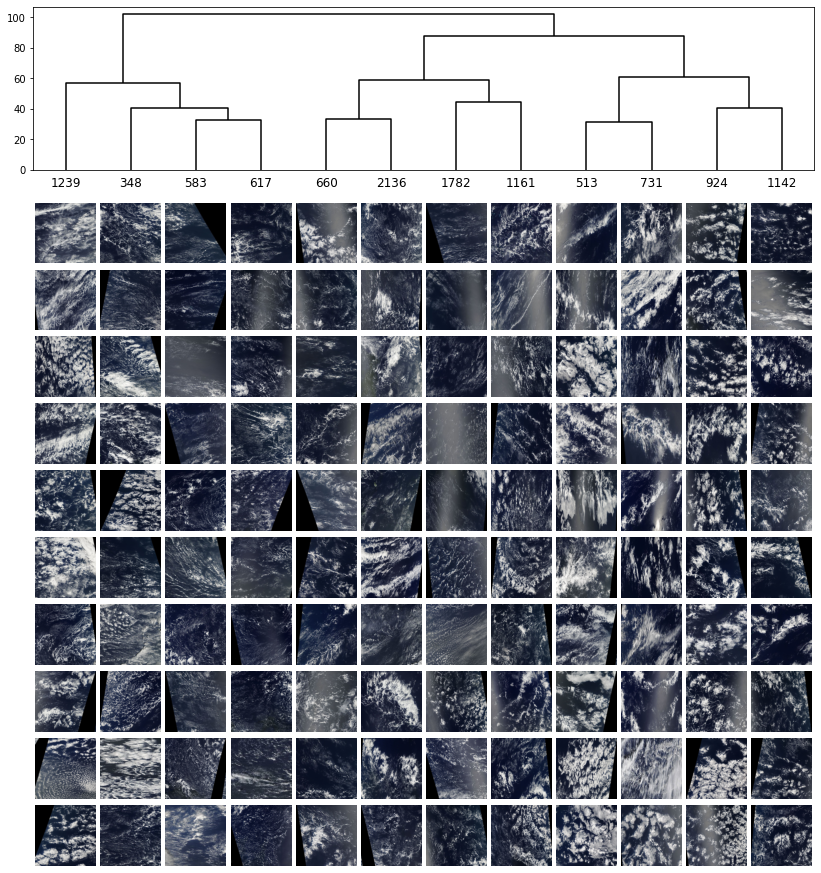

In [21]:

dataset_path =  DATASETS_path+'ZOONIVERSE_RESIZED/'
print("data set path : "+str(dataset_path))
tile_dataset = ImageSingletDataset(data_dir=dataset_path, tile_type=TileType.ANCHOR)
da_embeddings = get_embeddings(tile_dataset=tile_dataset, model=model)
clusters = convml_tt.interpretation.plots.dendrogram(da_embeddings, n_samples=10, n_clusters_max=12, return_clusters=True)

In [22]:
with open(DATASETS_path+"ZOONIVERSE_RESIZED/labels.pickle", "rb") as handle:
    labs = pickle.load(handle)
print(len(labs))
print(len(clusters[1]))

11836
11836


In [23]:
print(clusters[1])

[ 3 10  0 ... 11 11  6]


In [24]:
cfs_mat = confusion_matrix(labs, clusters[1])

(4, 12)
(4,)
(12, 4)


<AxesSubplot:title={'center':'Confusion Matrix Clusters MODIS model %'}>

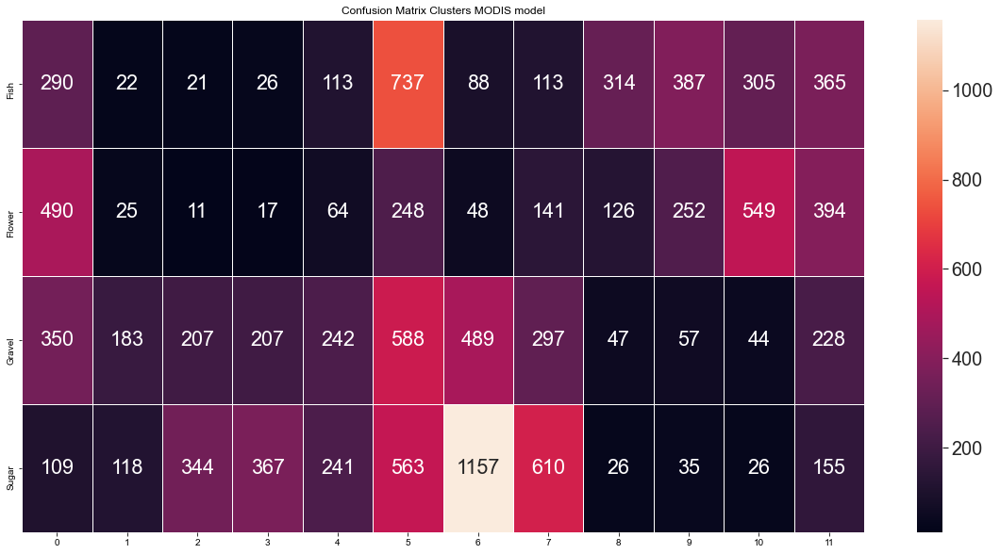

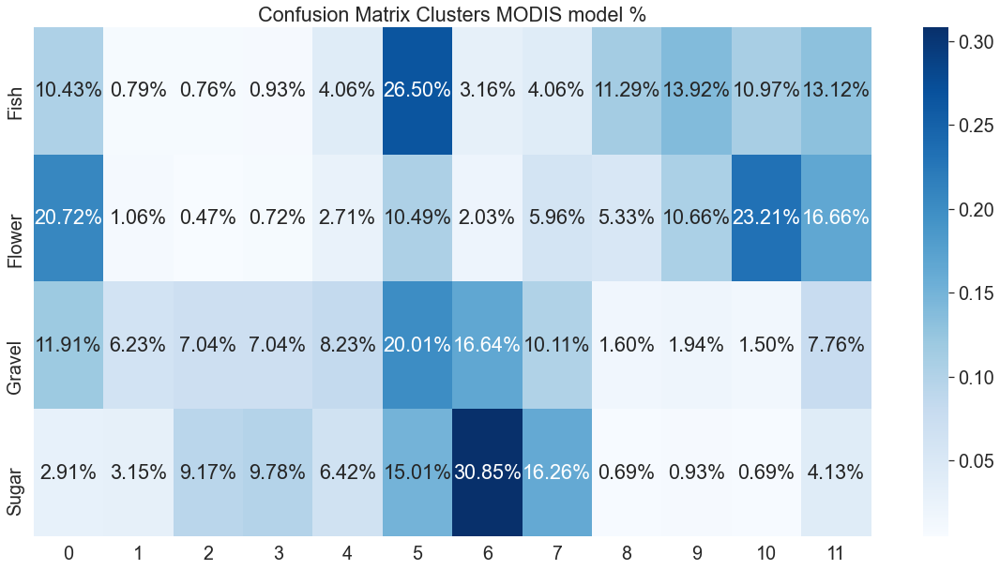

In [25]:

associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Clusters MODIS model")
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Clusters MODIS model %")
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [26]:
print(len(da_embeddings))
pca_2d = PCA(n_components=2, svd_solver='arpack')
principalComponents = pca_2d.fit_transform(da_embeddings)
print(principalComponents.shape)

11836
(11836, 2)


(11836,)
[ 1.8092437  -0.95251185  1.2306739  ... -0.4095129  -0.06106428
  0.36412716]






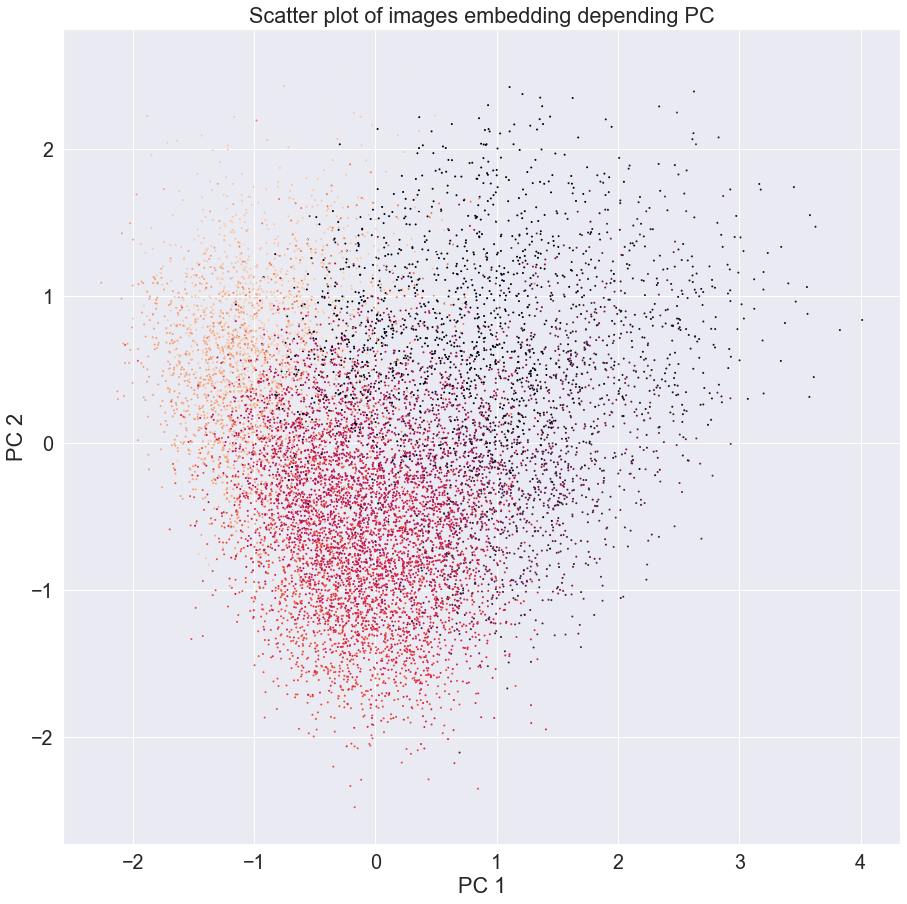

C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packa

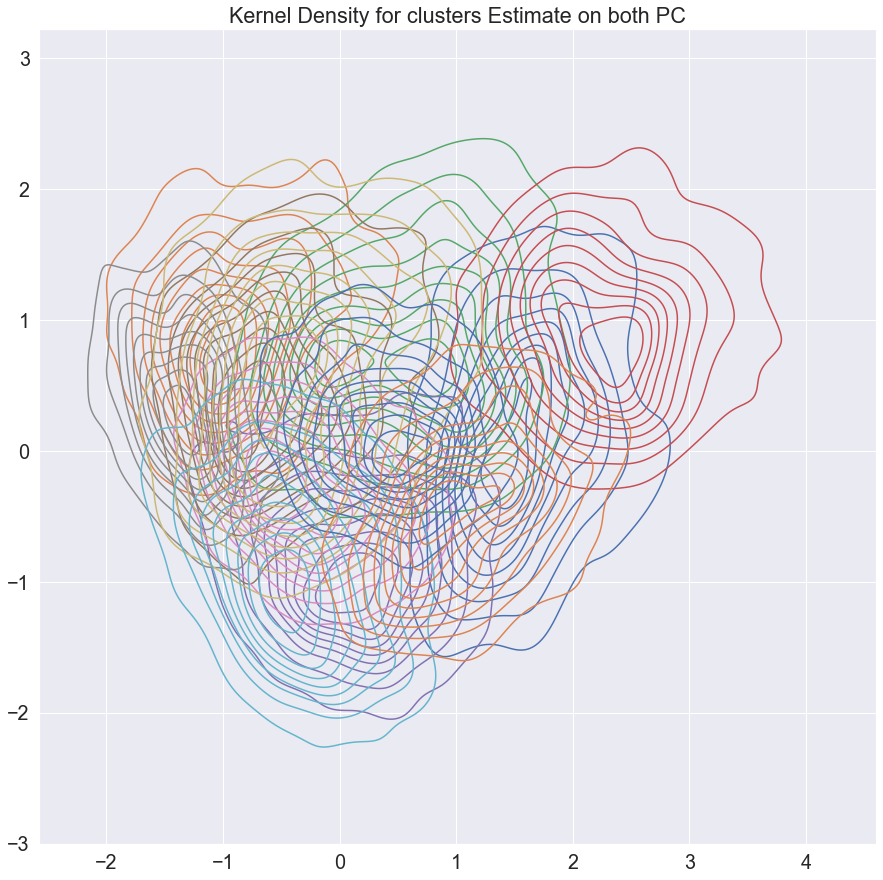

C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packa

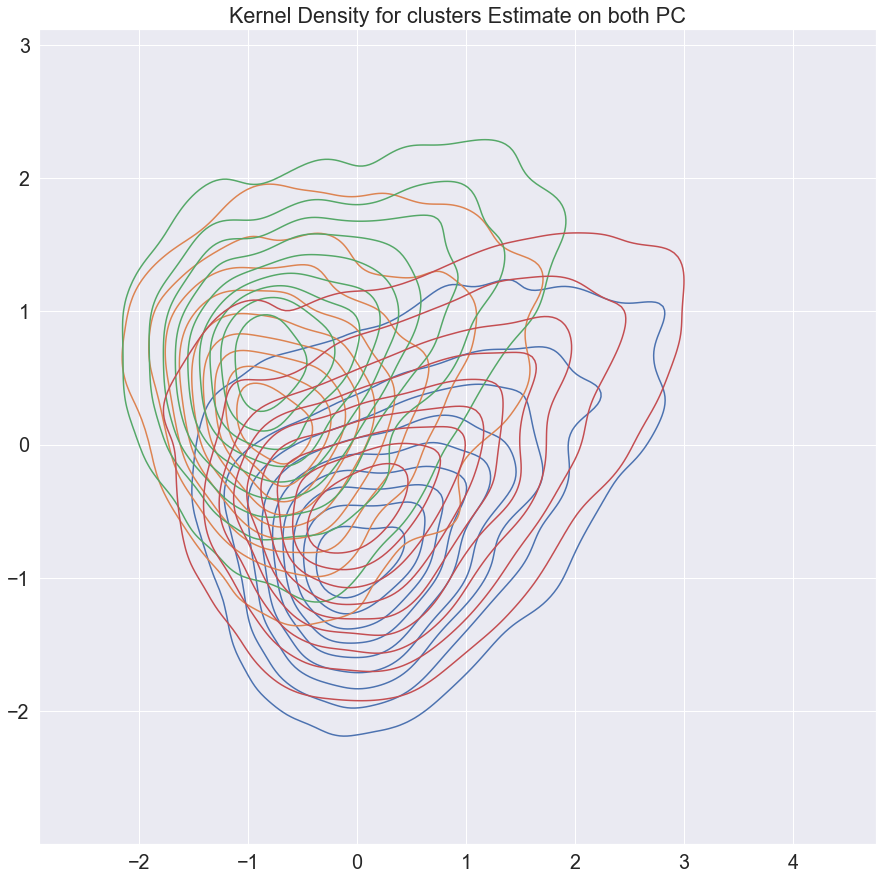

(119,)
[-1.6389806  -0.77333933  0.6369404  -0.3665166  -0.7989072  -1.8383161
  1.0255859  -1.2804301   0.00819593  0.5388761  -0.62585413  0.35916257
  0.41917583  2.1481023  -0.05173382 -0.7251383  -0.18191287 -0.01459963
  0.29417288  0.15070814  0.4596037   1.1054962   0.2908786   1.4914112
 -0.08139873 -1.0837168  -1.7716539   0.9006884  -0.51676255  1.3933234
 -0.3880101   0.35476014  0.9414413  -0.06452671  1.2517961  -0.01960339
  0.27740976  0.14191176 -2.0214365   0.15678015 -0.82562774 -0.3580455
  0.93979937  0.0041563   1.270885    0.26905623 -0.7996659   1.1202704
  0.24737832 -0.10735305 -0.9406131  -1.1049528   1.4922796  -1.2884905
 -1.1782917  -0.1980384  -1.0240147  -0.21155126  1.731066   -0.62837815
 -0.22244754  1.1294868  -0.6891693   0.8717625  -0.43625662  0.28951678
 -0.50025713 -0.68884695 -0.8467991   0.91365194 -0.52556056 -0.09140497
  0.7360918  -0.9673443  -0.36894736 -0.9961332  -0.53347594  0.5392965
 -1.2725229   0.5331465   0.01491098 -0.6184003  -1

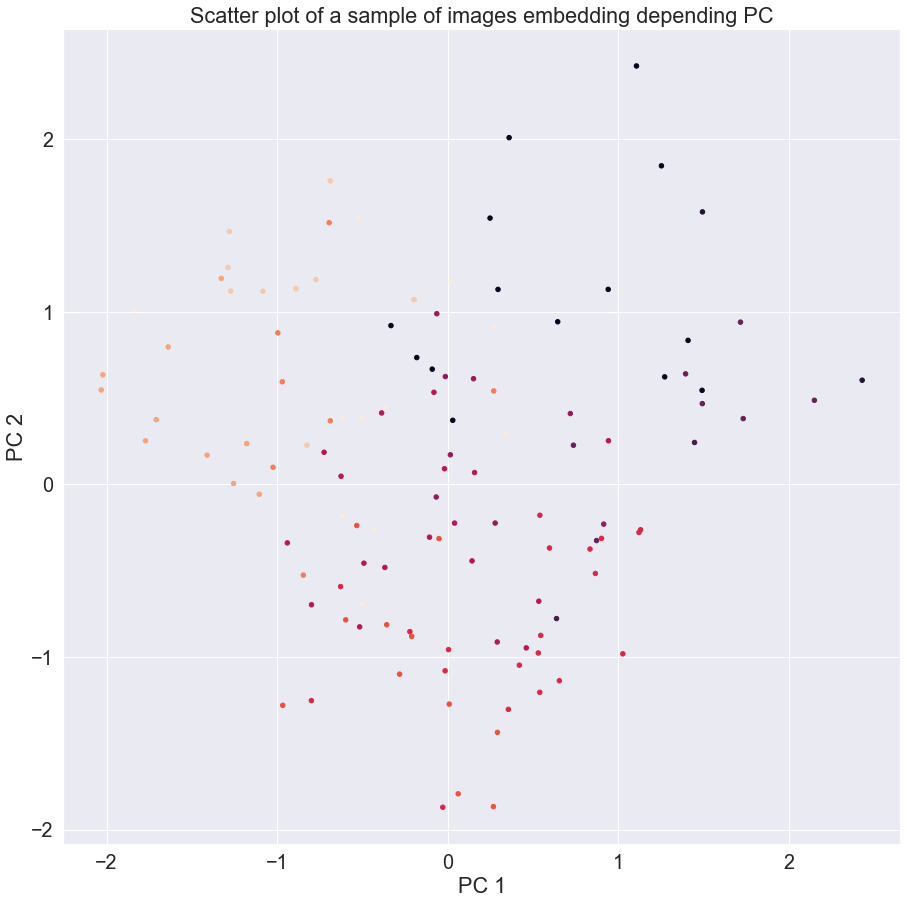

In [39]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( principalComponents, clusters[1], test_size=0.01, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=clusters[1], s=1)
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()




types = {}
cnt = 0
for i in clusters[1]:
    try:
        types[str(i)].append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
        cnt += 1
    except KeyError:
        types[str(i)] = []
        types[str(i)].append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
        cnt += 1
        

fig, ax = plt.subplots(figsize=(15,15))
for key in types:
    types[key] = np.array(types[key]).astype('float64')
    sns.kdeplot(types[key][:,0], types[key][:,1]) #, type1[:,1])

plt.title('Kernel Density for clusters Estimate on both PC')
plt.show()






types = {}
cnt = 0
for i in labs:
    try:
        types[str(i)].append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
        cnt += 1
    except KeyError:
        types[str(i)] = []
        types[str(i)].append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
        cnt += 1
        

fig, ax = plt.subplots(figsize=(15,15))
for key in types:
    types[key] = np.array(types[key]).astype('float64')
    sns.kdeplot(types[key][:,0], types[key][:,1]) #, type1[:,1])

plt.title('Kernel Density for clusters Estimate on both PC')
plt.show()








print(X_test[:, 0].shape)
print(X_test[:, 0])
print("\n\n\n")
fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20)
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

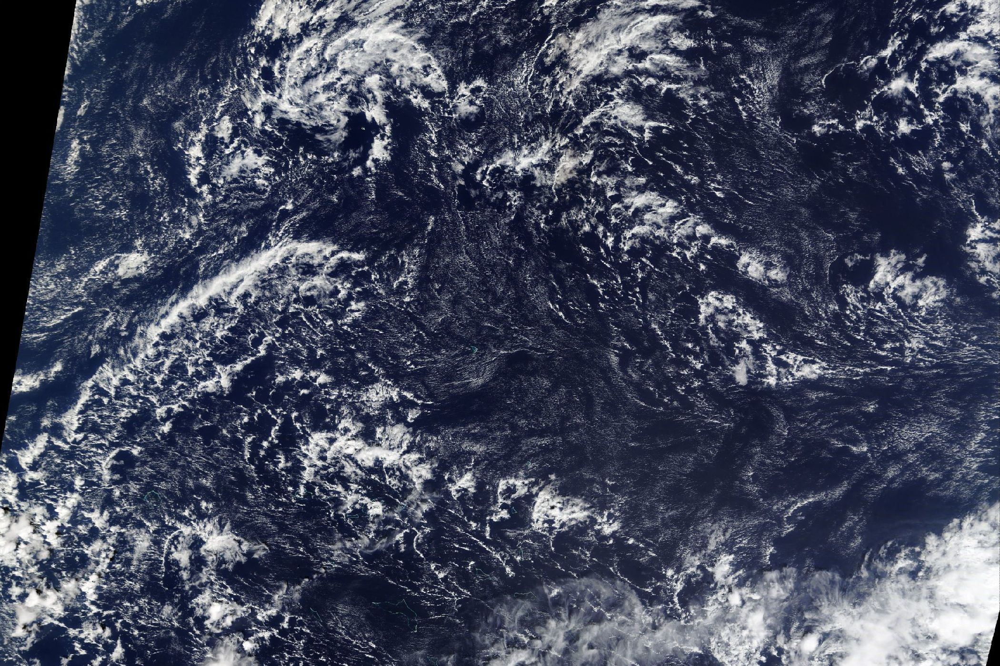

In [28]:
img = Image.open(DATASETS_path+"zooniverse_kaggle/train_images/2d9da73.jpg")
img

In [29]:
da_emb = make_sliding_tile_model_predictions(img=img, model=model, step=(100, 100))

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:10<00:00,  1.37s/it]


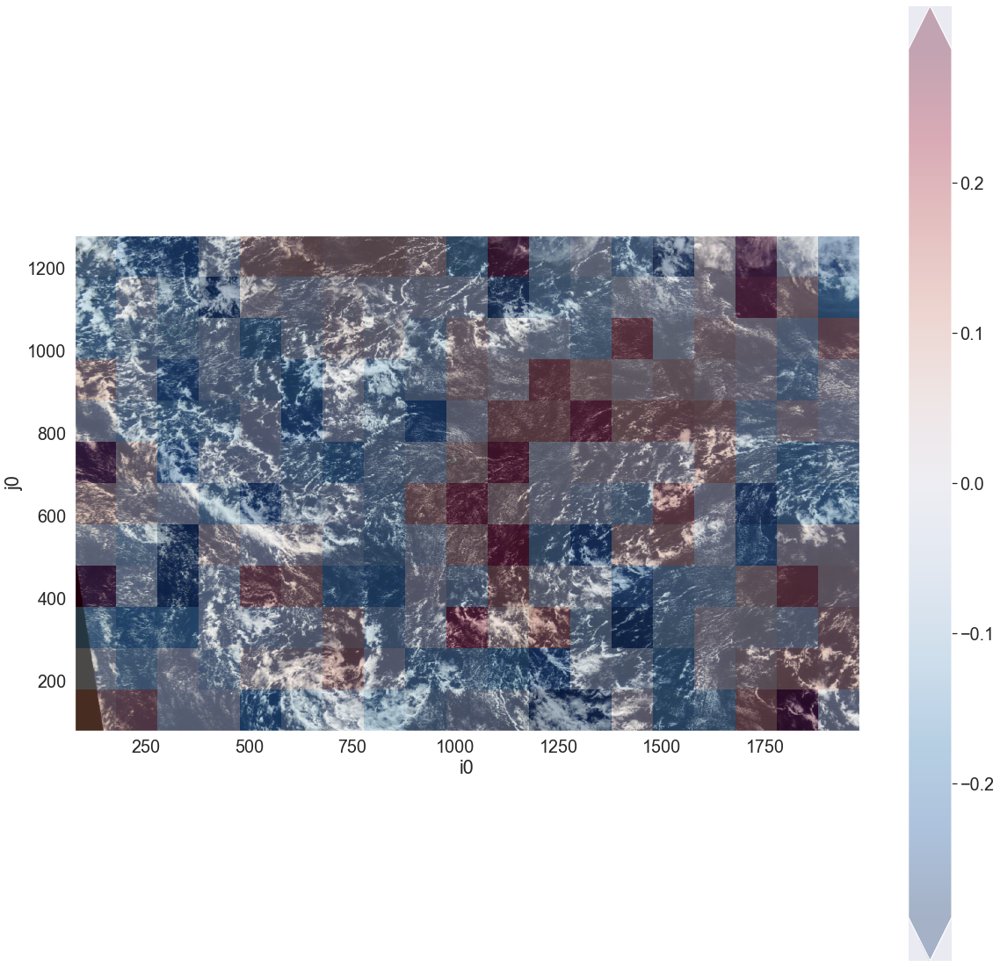

In [30]:
r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(img)
da_emb.isel(emb_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

C:\Users\Ray\anaconda3\lib\site-packages\xarray\core\dataarray.py:745: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data


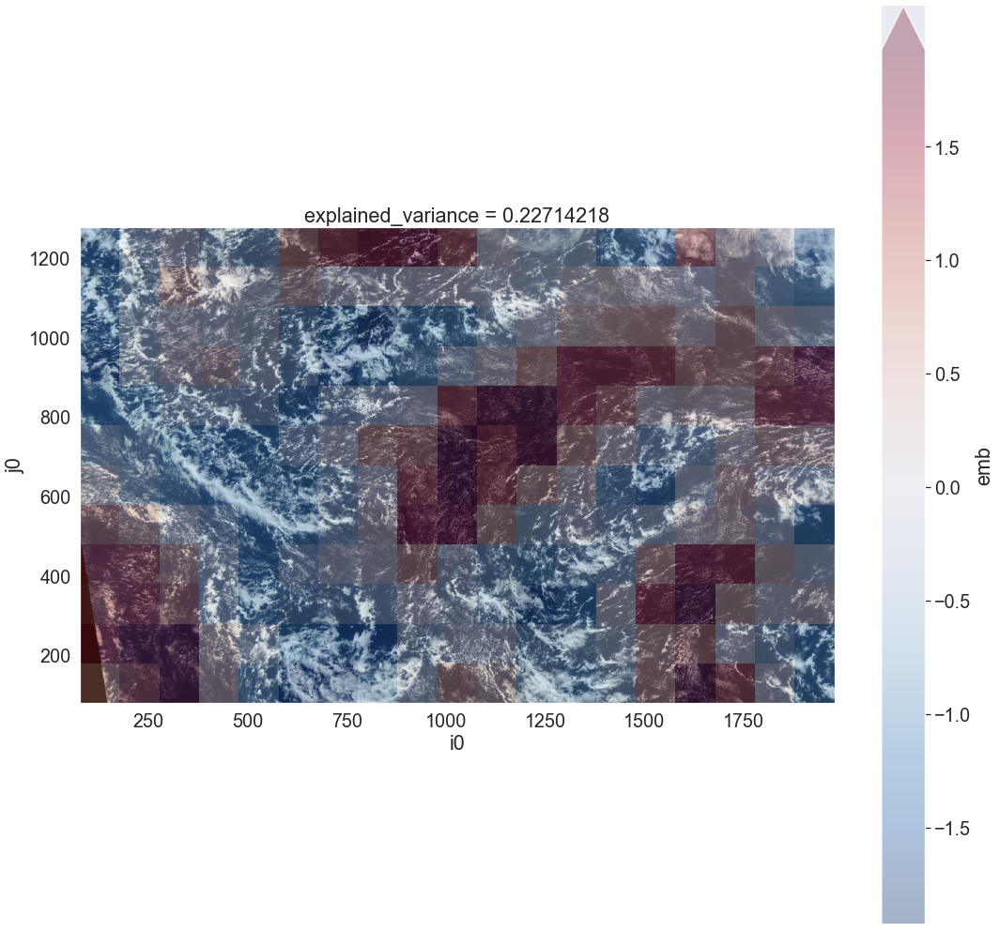

In [31]:
da_emb_pca = apply_transform(da_emb, "pca")

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

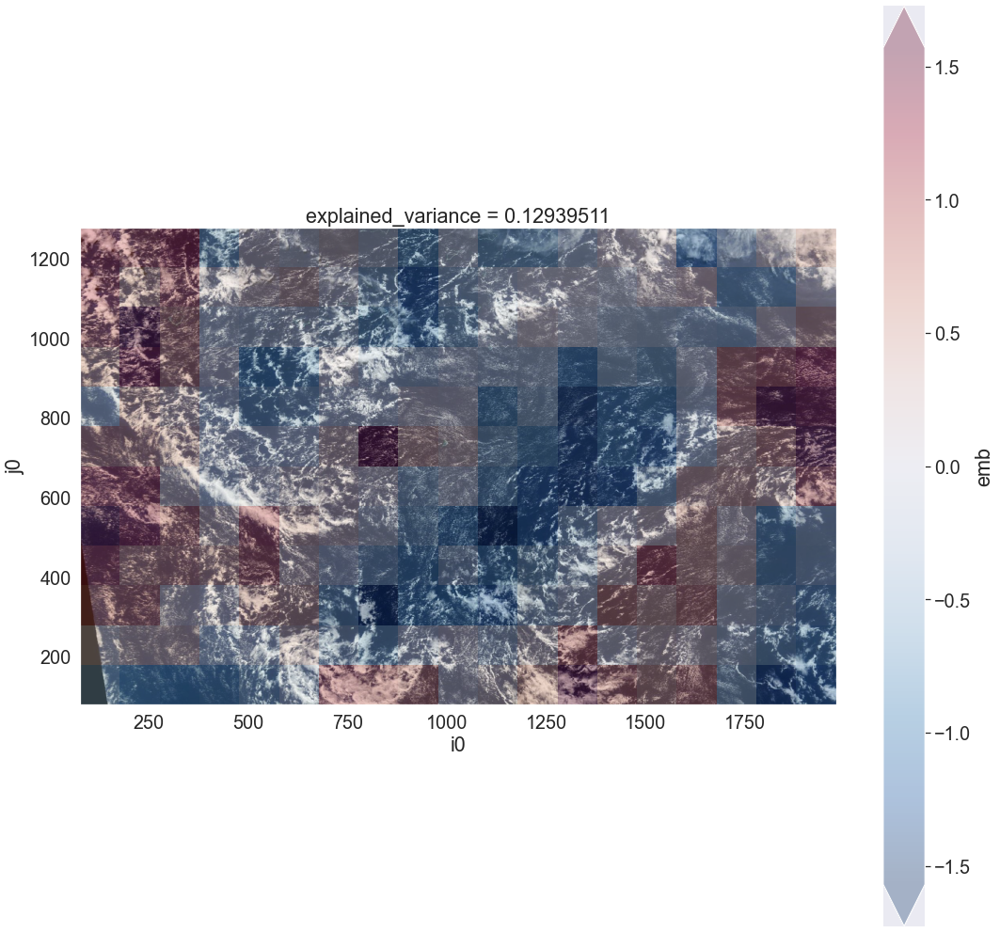

In [32]:
# looking at the second PCA component

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=1).plot(ax=ax, y="j0", alpha=0.3, robust=True)

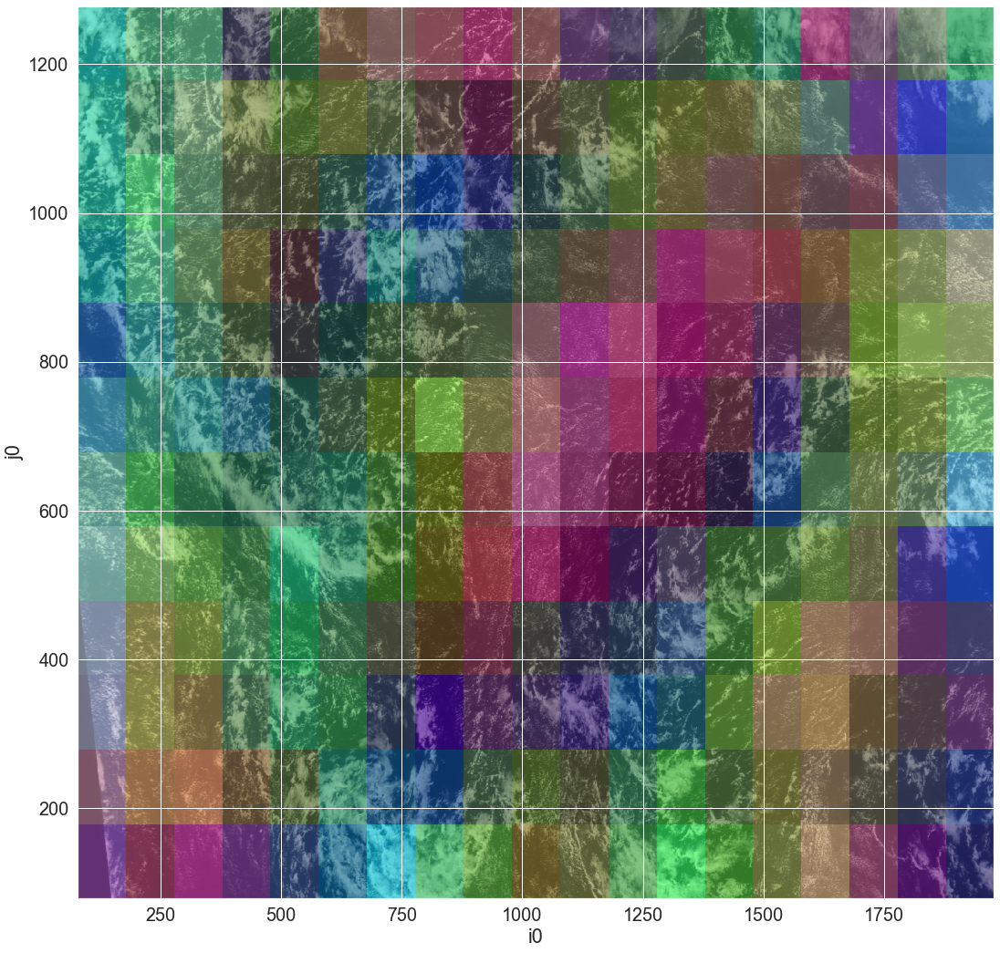

In [33]:
da_rgba = make_rgb(da_emb_pca, pca_dim=[0,1,2], alpha=0.6)
r_aspect = img.size[0] / img.size[1]
fig, ax = plt.subplots(figsize=(18 ,18))
ax.imshow(img)
da_rgba.plot.imshow(rgb="rgba", y="j0", ax=ax)

(11836,)
[ 1.8092437  -0.95251185  1.2306739  ... -0.4095129  -0.06106428
  0.36412716]






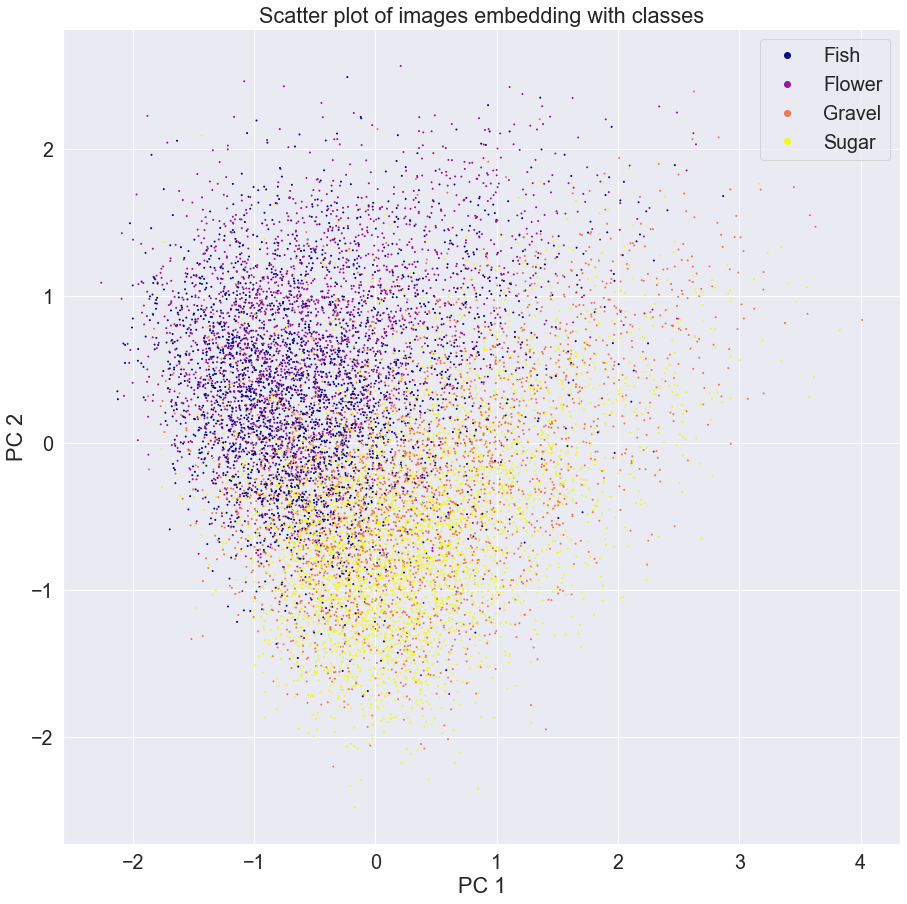

C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packa

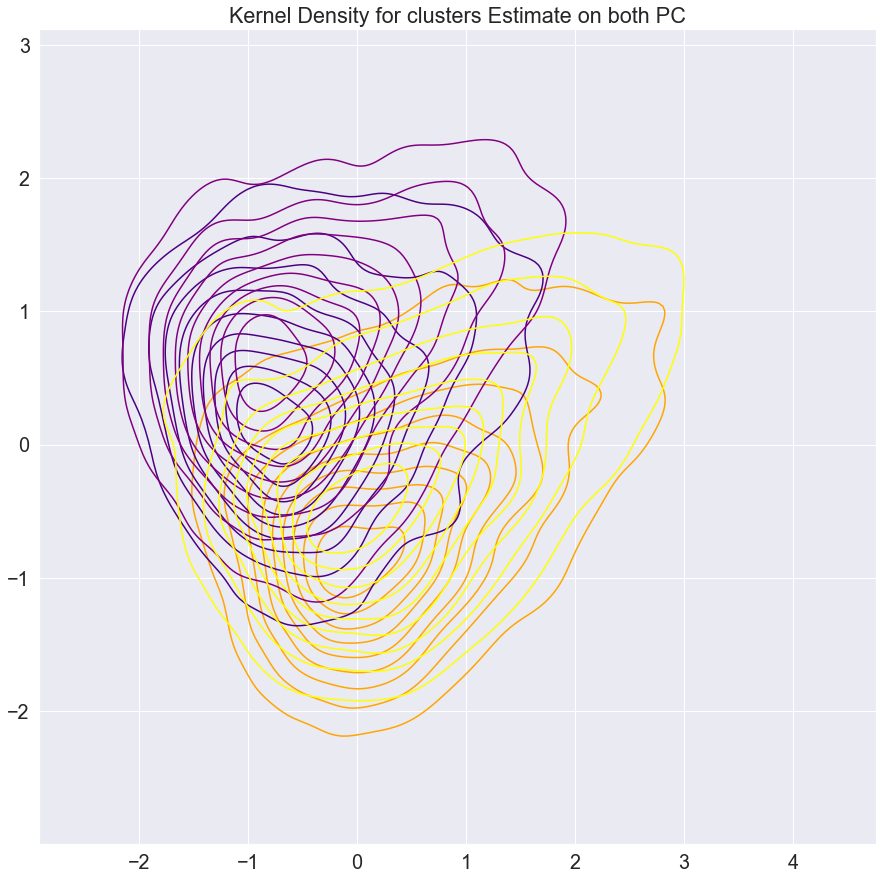

'\n\n\nclf = NearestCentroid()\nclf.fit(principalComponents, labs)\nfig, ax = plt.subplots(figsize=(15,15))\nprint("Centroids : ")\nprint(clf.centroids_)\nprint("Shape : "+str(clf.centroids_.shape))\nscatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], c=[0, 1, 2, 3], s=45 , cmap="plasma")\nplt.legend(handles=scatter.legend_elements()[0], labels=associations)\nplt.title(\'Scatter plot of centroids of each class\')\nax.set_xlabel(\'PC 1\')\nax.set_ylabel(\'PC 2\')\nplt.show()\n'

In [49]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")

labs_np = np.array(labs)
X_train, X_test, y_train, y_test = train_test_split( principalComponents, labs, test_size=0.01, random_state=42)




fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=labs, s=1 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


"""
fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=18 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of sample of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()
"""




types = {}
cnt = 0
for i in labs:
    try:
        types[str(i)].append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
        cnt += 1
    except KeyError:
        types[str(i)] = []
        types[str(i)].append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
        cnt += 1
        

fig, ax = plt.subplots(figsize=(15,15))
colors = ["orange", "indigo","purple", "yellow"]
cnt = 0
for key in types:
    types[key] = np.array(types[key]).astype('float64')
    sns.kdeplot(types[key][:,0], types[key][:,1], color=colors[cnt]) #, type1[:,1])
    cnt += 1

plt.title('Kernel Density for clusters Estimate on both PC')
plt.show()



"""


clf = NearestCentroid()
clf.fit(principalComponents, labs)
fig, ax = plt.subplots(figsize=(15,15))
print("Centroids : ")
print(clf.centroids_)
print("Shape : "+str(clf.centroids_.shape))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], c=[0, 1, 2, 3], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()
"""
